In [1]:
!nvidia-smi

Fri Jun 16 22:40:39 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.43.02              Driver Version: 535.98       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        On  | 00000000:0C:00.0  On |                  N/A |
| 53%   34C    P5              52W / 390W |   2430MiB / 24576MiB |     29%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Create your dataset

1) Choose which classes you would like to add.

2) Create a dataset with your own photos

3) Separate your dataset into train and test subsets.

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from glob import glob
import PIL

def create_dataframe_from_directories(path):
    data = []

    for label_dir in os.listdir(path):
        if os.path.isfile(label_dir):
            continue

        label_path_path = os.path.join(path, label_dir)
        for file in os.listdir(label_path_path):
            data.append([os.path.join(label_path_path, file), label_dir])
        
    return pd.DataFrame(data, columns = ["path", "label"])

In [4]:
train_df = create_dataframe_from_directories("dataset_train")
test_df = create_dataframe_from_directories("dataset_test")

In [5]:
LABEL_NAMES = pd.unique(train_df['label'])
LABEL_NAMES

array(['van', 'pickup', 'hatchback', 'suv'], dtype=object)

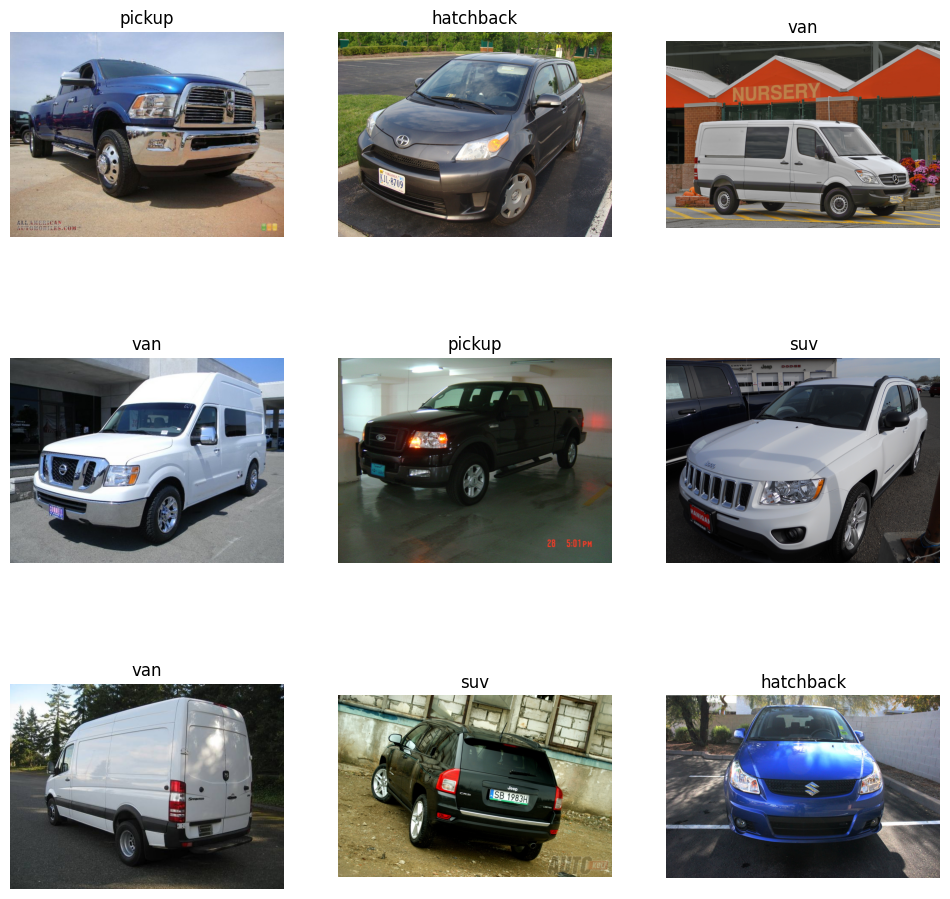

In [9]:
import matplotlib.pyplot as plt
import PIL
import PIL.Image
 
plt.figure(figsize=(12, 12))

i = 0
for _, rowdata in train_df.sample(frac=1).head(9).iterrows():
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(PIL.Image.open(rowdata.path))
    plt.title(rowdata.label)
    plt.axis("off")
    i += 1

# Explore your dataset

In [7]:
def create_histogram(train, test):
    df1 = train.groupby('label').count()
    df2 = test.groupby('label').count()
    df = pd.merge(df1, df2, on='label')
    
    return df.plot.bar(title="Nombre d'images par classe",
                       xlabel='Classe',
                       ylabel="Nombre d'images").legend(["Train", "Test"])

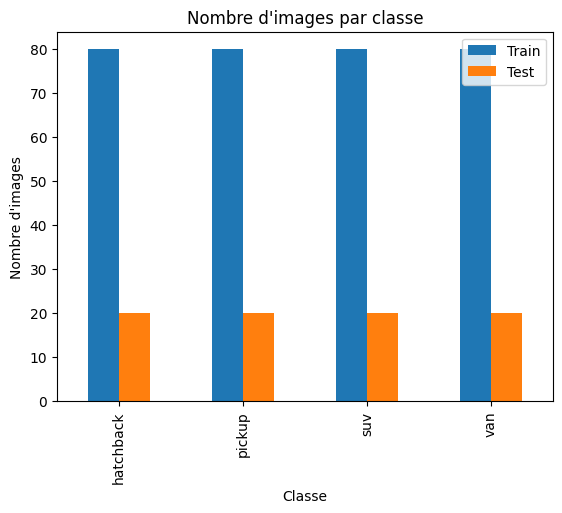

In [8]:
create_histogram(train_df, test_df)

# Preprocessing steps

In [9]:
from tensorflow.keras.layers import *
from keras_cv.layers import Grayscale
from tensorflow.keras import Sequential

IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    Resizing(IMG_HEIGHT, IMG_WIDTH, crop_to_aspect_ratio=False),
    Rescaling(1. / 255),
    # Grayscale(),
])

image_augmentations = Sequential([
    # TODO: choose some image augmentations layers
    # see which keras layers you can use
    # The kind of layers you will want to use starts with "Random".
    # See the following page for more information on data augmentation :
    # https://www.tensorflow.org/tutorials/images/data_augmentation
    RandomFlip(seed=None),
    RandomZoom(height_factor=(0.0, -0.3), width_factor=(0.0, -0.3), fill_mode="reflect", interpolation="bilinear", seed=None),  
    RandomRotation(0.2),
    RandomContrast(factor=[0.25, 0.6], seed=None),
])

def open_images(paths):
    return np.stack([
        open_image(path) for path in paths
    ])

def open_image(path):
    with PIL.Image.open(path) as image:
        opened_img = image_preprocesses(np.asarray(image))
    
    return opened_img

def augment_images(images):
    return np.stack([
        image_augmentations(img) for img in images
    ])

/home/loich/mambaforge/envs/ARN2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-06-16 22:40:47.950443: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0c:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-16 22:40:47.960280: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


**TODO**: plot examples of preprocessed and augmented images

## Define model

In [10]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Model
from tensorflow.keras.layers import *

def get_model():
    base_model = MobileNetV2(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )
    
    layers = base_model.output

    added_layers = [
        # important, we need global average pooling instead of flatten for class activation map later on 
        GlobalAveragePooling2D(), 
        Dense(
            128,
            kernel_regularizer = tf.keras.regularizers.l2(l = 0.012),
            activity_regularizer=tf.keras.regularizers.l1(0.006),
            bias_regularizer=tf.keras.regularizers.l1(0.006),
            activation='relu'
        ),
        Dropout(rate=0.4),
        Dense(len(LABEL_NAMES), activation='softmax')
    ]

    model = Model(inputs=base_model.input, outputs=Sequential(added_layers)(layers))

    # TODO: freeze layers
    for layer in model.layers[:len(base_model.layers) - 1]:
        layer.trainable=False
    
    model.compile(
      optimizer = RMSprop(),
      loss = SparseCategoricalCrossentropy(),
      metrics = ['acc']
    )
        
    return model

In [11]:
get_model().summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

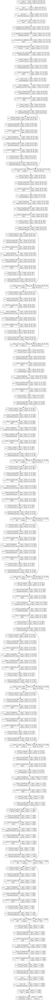

In [12]:
from keras.utils import plot_model
plot_model(
    get_model(),
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True,
    show_trainable=True,
    to_file='fashion_mnist-model.png'
)

# Model training

**TODO**: cross-validate your model, you can base yourself on the code from the first part of this practical work

**NOTE**: you shouldn't augment validations images. What we want to evaluate is the performances on "real" images, not on images that are augmented and change all the time 

In [12]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ReduceLROnPlateau

shuffled_dataset = train_df.sample(frac=1, random_state=1234).reset_index(drop=True)

dataset_paths = shuffled_dataset['path'].to_numpy()
dataset_labels = shuffled_dataset['label'].to_numpy()

total_train_paths, test_paths, total_train_labels, test_labels = train_test_split(
    dataset_paths, dataset_labels, test_size=0.2, random_state=1234
)

# We need to convert from string labels to integers
label_encoder = LabelEncoder()
label_encoder.fit(dataset_labels)
total_train_labels = label_encoder.transform(total_train_labels)
test_labels = label_encoder.transform(test_labels)

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

NB_EPOCHS = 8
callbacks = [
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=3,
        min_lr=1e-8
    )
]

for train_index, val_index in KFold(n_splits=5).split(total_train_paths, total_train_labels):
    # augment images in train
    train_images = augment_images(open_images(total_train_paths[train_index]))    
    train_labels = total_train_labels[train_index]
    
    val_images = open_images(total_train_paths[val_index])
    val_labels = total_train_labels[val_index]
    
    model = get_model() # We reinitialize the model
    
    history = model.fit(
        x=train_images,
        y=train_labels,
        callbacks=callbacks,
        batch_size=32,
        validation_data=[val_images, val_labels],
        epochs=NB_EPOCHS,
    )
    
    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])
    train_accuracies.append(history.history['acc'])
    val_accuracies.append(history.history['val_acc'])


Epoch 1/8
7/7 [==============================] - 3s 272ms/step - loss: 4.9085 - acc: 0.2941 - val_loss: 3.8547 - val_acc: 0.3077 - lr: 0.0010
Epoch 2/8
7/7 [==============================] - 1s 206ms/step - loss: 3.6460 - acc: 0.4951 - val_loss: 3.5340 - val_acc: 0.4038 - lr: 0.0010
Epoch 3/8
7/7 [==============================] - 1s 204ms/step - loss: 3.2549 - acc: 0.6324 - val_loss: 3.2557 - val_acc: 0.5192 - lr: 0.0010
Epoch 4/8
7/7 [==============================] - 1s 202ms/step - loss: 2.8860 - acc: 0.7549 - val_loss: 3.2504 - val_acc: 0.4231 - lr: 0.0010
Epoch 5/8
7/7 [==============================] - 1s 188ms/step - loss: 2.6184 - acc: 0.8039 - val_loss: 2.8873 - val_acc: 0.5962 - lr: 0.0010
Epoch 6/8
7/7 [==============================] - 1s 189ms/step - loss: 2.4623 - acc: 0.7941 - val_loss: 2.6649 - val_acc: 0.6154 - lr: 0.0010
Epoch 7/8
7/7 [==============================] - 1s 202ms/step - loss: 2.2193 - acc: 0.8676 - val_loss: 2.5489 - val_acc: 0.5962 - lr: 0.0010
Epoch 

# Results

In [13]:
def plot_kfold_mean_performance(ax, train_performances, val_performances, measure_name):
    train_mean = np.mean(train_performances, axis=0)
    val_mean = np.mean(val_performances, axis=0)
    train_sd = np.std(train_performances, axis=0)
    val_sd = np.std(val_performances, axis=0)
    
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean+train_sd, facecolor='blue', alpha=0.5, label='Train')
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean-train_sd, facecolor='blue', alpha=0.5)

    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean+val_sd, facecolor='orange', alpha=0.5, label='Val')
    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean-val_sd, facecolor='orange', alpha=0.5)

    ax.set_xticks(np.arange(NB_EPOCHS))

    ax.set_ylabel(measure_name)
    ax.set_xlabel('Number of epochs')
    #pl.title(str(K)+'-fold CV with '+str(n)+' hidden neurons')
    ax.legend()
    ax.grid()

Train Loss function: 2.05629723072052
Train Accuracy: 0.8291391730308533
-----------------------------------------
Val Loss function: 2.39860520362854
Val Accuracy: 0.5941930770874023


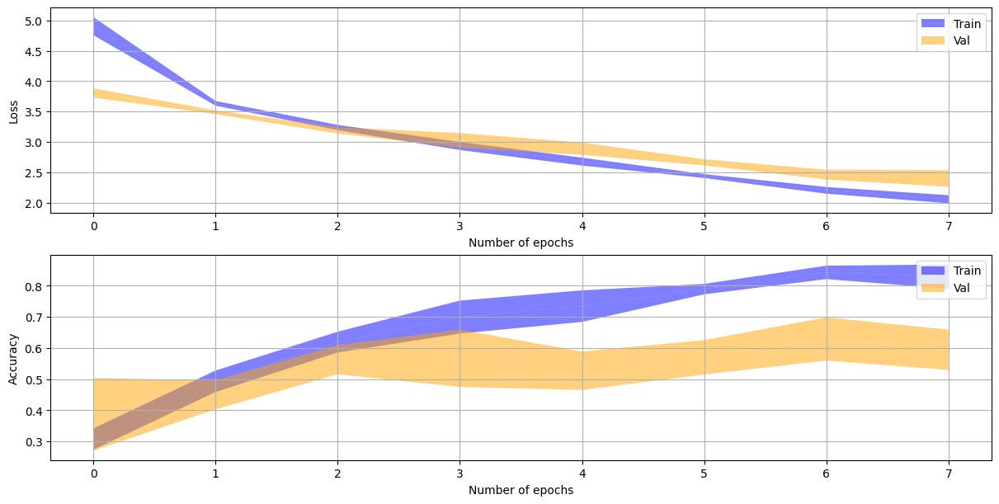

In [14]:
fig, ax = plt.subplots(2, 1, constrained_layout=True, figsize=(12,6))

plot_kfold_mean_performance(ax[0], train_losses, val_losses, "Loss")
plot_kfold_mean_performance(ax[1], train_accuracies, val_accuracies, "Accuracy")

print(f'Train Loss function: {np.mean(np.array(train_losses)[:, -1])}')
print(f'Train Accuracy: {np.mean(np.array(train_accuracies)[:, -1])}')
print('-----------------------------------------')
print(f'Val Loss function: {np.mean(np.array(val_losses)[:, -1])}')
print(f'Val Accuracy: {np.mean(np.array(val_accuracies)[:, -1])}')

## Evaluate model on test set

In [15]:
import sklearn.metrics as me

test_images = open_images(test_paths)    

pred = model.predict(test_images)
pred = np.argmax(pred, axis=-1)

test_confusion_matrix = me.confusion_matrix(test_labels, pred, labels=np.arange(len(LABEL_NAMES)))

2/2 [==============================] - 1s 186ms/step


In [16]:
def compute_fscore(matrix, c):
    selector = [x for x in range(matrix.shape[1]) if x != c]
    tp = matrix[c,c]
    fp = np.sum(matrix[selector,c])
    fn = np.sum(matrix[c,selector])
    if (tp == 0 or tp + fp == 0 or tp + fn == 0): return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    return 2 * precision * recall / (precision + recall)

def plot_confusion_matrix(conf_matrix, classes_names):
    fig, ax = plt.subplots(figsize=(8,8))
    im = ax.imshow(conf_matrix, cmap="viridis")

    # Show all ticks and label them with the respective list entries
    ax.set_xticks(np.arange(len(classes_names)), labels=classes_names, rotation='vertical')
    ax.set_yticks(np.arange(len(classes_names)), labels=classes_names)
    ax.set_ylabel("Ground Truth", fontsize=14)
    ax.set_xlabel("Predictions", fontsize=14)
    # Rotate the tick labels and set their alignment.
    #plt.setp(ax.get_xticklabels(), rotation=0, ha="right", rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(classes_names)):
        for j in range(len(classes_names)):
            text = ax.text(j, i, conf_matrix[i, j], fontweight="bold", fontsize="medium", ha="center", va="center", c="r")

    fig.tight_layout()
    plt.show()

    for i in range(len(classes_names)):
        print(f"F-score {classes_names[i]}: {compute_fscore(conf_matrix, i)}")

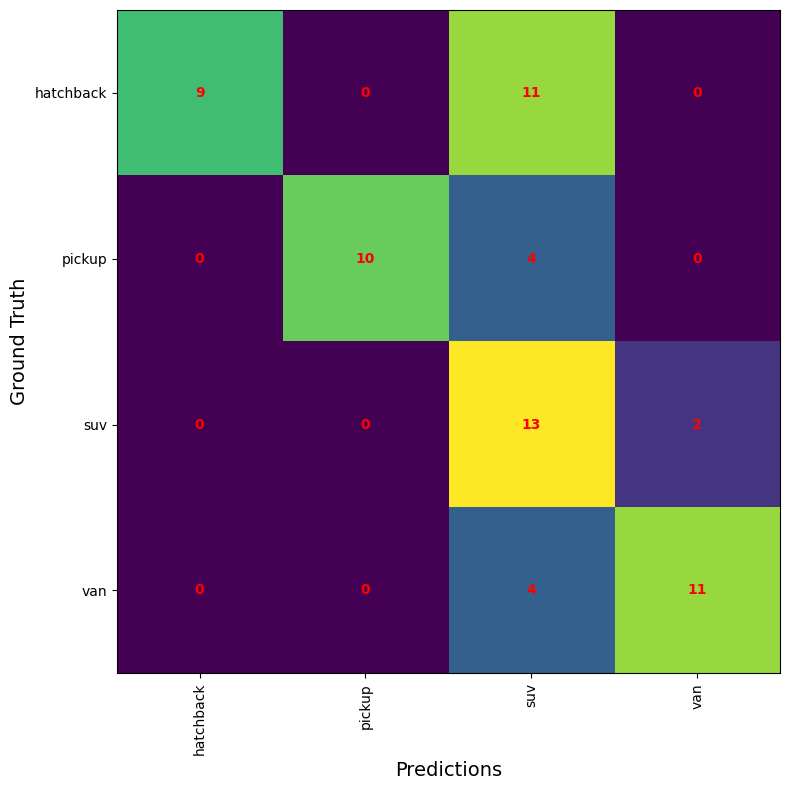

F-score hatchback: 0.6206896551724138
F-score pickup: 0.8333333333333333
F-score suv: 0.5531914893617021
F-score van: 0.7857142857142856


In [17]:
plot_confusion_matrix(test_confusion_matrix, label_encoder.classes_)

In [18]:
print(f'F1 score global: {me.f1_score(test_labels, pred, average="macro")}')

F1 score global: 0.6982321908954338


**TODO**: when you've selected a final model, evaluate its performances (f-score, confusion matrix, ...) on your test set

### Display some misclassified images

['hatchback' 'pickup' 'suv' 'van']
['hatchback' 'pickup' 'suv' 'van']
['hatchback' 'pickup' 'suv' 'van']
['hatchback' 'pickup' 'suv' 'van']
['hatchback' 'pickup' 'suv' 'van']
['hatchback' 'pickup' 'suv' 'van']


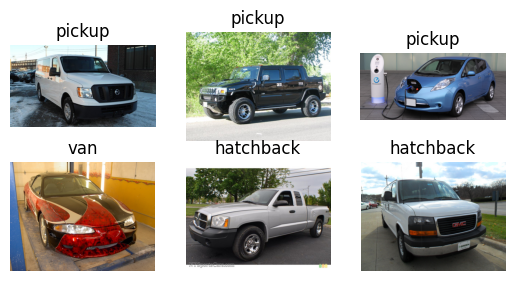

In [19]:
import random

i = 0

for x in random.sample(range(len(test_labels)),28):
    if(pred[x] != test_labels[x]):
        if i >= 9:
            continue

        print(label_encoder.classes_)
        
        ax = plt.subplot(3, 3, i + 1)
        i += 1
        plt.imshow(PIL.Image.open(test_df['path'][x]))
        plt.title(label_encoder.classes_[test_labels[x]])
        plt.axis("off")

**TODO**: display some misclassified images to be able to see what images are difficult for the model

## Use grad-cam to inspect how the model classify
Here we can see an heatmap of the regions that activates the model the most.

### For more information:
- tf-keras-vis documentation: https://keisen.github.io/tf-keras-vis-docs/
- Grad-cam paper: https://arxiv.org/pdf/1610.02391.pdf
- Grad-cam++ paper: https://arxiv.org/pdf/1710.11063.pdf

**NOTE**: maybe you will need to adapt some variable names based on your code above. For example, _model_ should be the model trained on all the training data. 

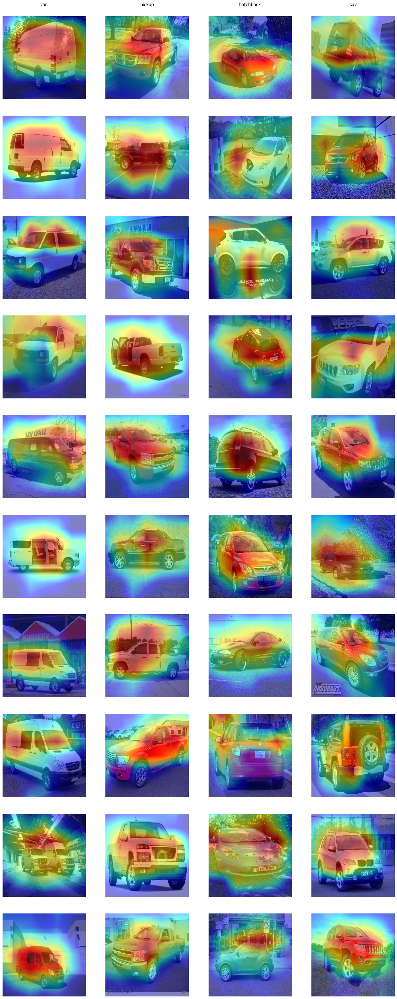

In [20]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)
    
    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)    
        pred = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(pred))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

### Grad-cam on misclassified images

**TODO**: now do the same than above, but with the misclassified images. You shouldn't change anything pertaining to grad-cam besides on which image and prediction you do it

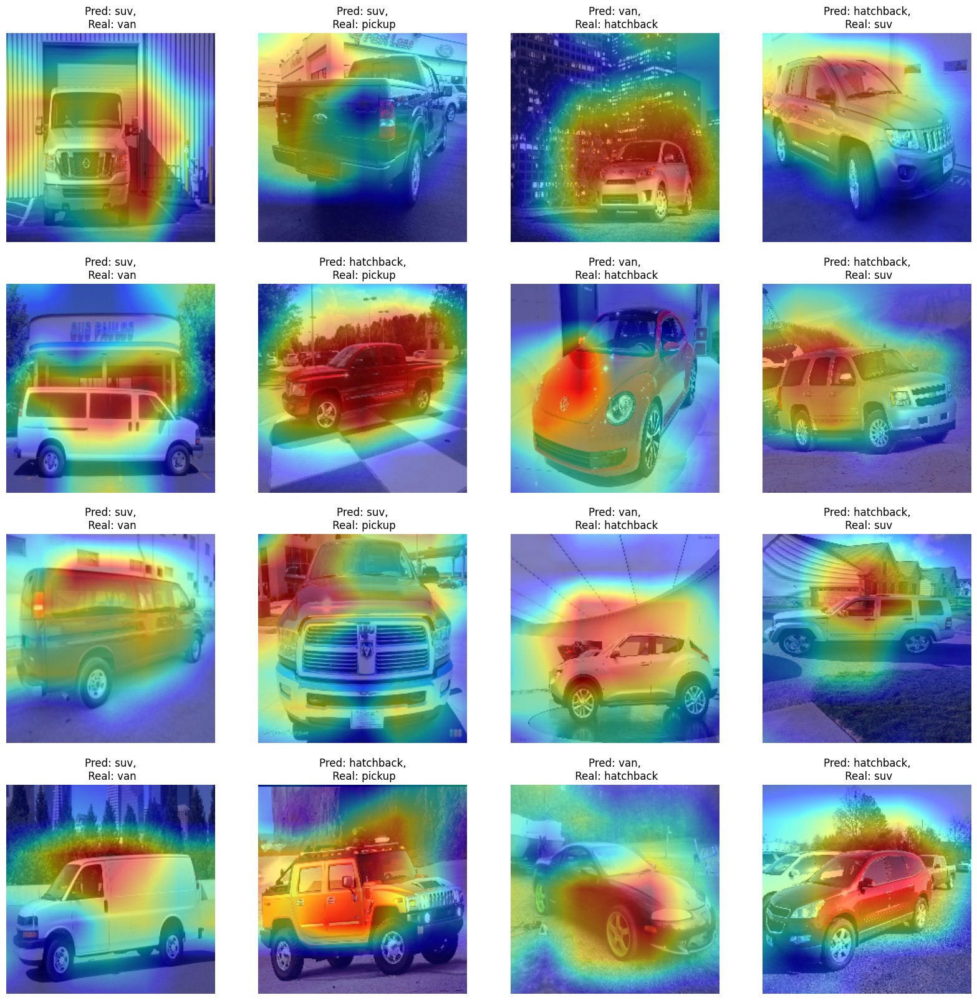

In [24]:
nb_missed_images_per_class = 4
total_missed = nb_missed_images_per_class * len(LABEL_NAMES)

fig, axs = plt.subplots(nb_missed_images_per_class, len(LABEL_NAMES), figsize=(20, 20))

misclassified_per_class = np.zeros(len(LABEL_NAMES), dtype=int)

current = 0

for _, rowdata in test_df.sample(frac=1).iterrows():
    img = open_image(rowdata.path)
    pred = model(np.expand_dims(img, axis=0))

    index = np.argmax(pred)

    pred_label_name = LABEL_NAMES[index]
    true_label_idx = np.where(LABEL_NAMES == rowdata.label)[0][0]

    if pred_label_name == rowdata.label or misclassified_per_class[true_label_idx] >= nb_missed_images_per_class:
        continue

    i = misclassified_per_class[true_label_idx]

    score = CategoricalScore(index)
    cam = gradcam(score, img)
    heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    axs[i,true_label_idx].imshow(img, vmin=0, vmax=1)
    axs[i,true_label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    axs[i,true_label_idx].axis("off")
    axs[i, true_label_idx].set_title(f"Pred: {pred_label_name},\n Real: {rowdata.label}")

    misclassified_per_class[true_label_idx] += 1
    current += 1

    if current == total_missed:
        break



**TODO**: try to determine what caused the misclassifcations and what you can do about it

In [25]:
import tensorflow as tf
from tflite_support.metadata_writers import image_classifier
from tflite_support.metadata_writers import writer_utils

class_names = LABEL_NAMES

# Task Library expects label files that are in the same format as the one below.
LABEL_FILE = "labels.txt"
SAVE_TO_PATH = "MyModel.tflite"

# Create the labels file
with open(LABEL_FILE, 'w') as label_file:
    for label in class_names: # /!\ class_names variable must contains the names of the labels you have.
        label_file.write("{}\n".format(label))

tflite_model = tf.lite.TFLiteConverter.from_keras_model(model).convert()

# Save the model.
with open(SAVE_TO_PATH, 'wb') as f:
    f.write(tflite_model)
    
ImageClassifierWriter = image_classifier.MetadataWriter

# Normalization parameters is required when reprocessing the image. It is
# optional if the image pixel values are in range of [0, 255] and the input
# tensor is quantized to uint8. See the introduction for normalization and
# quantization parameters below for more details.
# https://www.tensorflow.org/lite/convert/metadata#normalization_and_quantization_parameters)
INPUT_NORM_MEAN = 127.5
INPUT_NORM_STD = 127.5

# Create the metadata writer.
writer = ImageClassifierWriter.create_for_inference(
    writer_utils.load_file(SAVE_TO_PATH),
    [INPUT_NORM_MEAN],
    [INPUT_NORM_STD],
    [LABEL_FILE]
)

# Verify the metadata generated by metadata writer.
print(writer.get_metadata_json())

# Populate the metadata into the model.
writer_utils.save_file(writer.populate(), SAVE_TO_PATH)

2023-06-16 18:10:56.550166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,128]
	 [[{{node inputs}}]]
2023-06-16 18:11:00.395424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,128]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: /tmp/tmpoqd9cod7/assets


INFO:tensorflow:Assets written to: /tmp/tmpoqd9cod7/assets


{
  "name": "ImageClassifier",
  "description": "Identify the most prominent object in the image from a known set of categories.",
  "subgraph_metadata": [
    {
      "input_tensor_metadata": [
        {
          "name": "image",
          "description": "Input image to be classified.",
          "content": {
            "content_properties_type": "ImageProperties",
            "content_properties": {
              "color_space": "RGB"
            }
          },
          "process_units": [
            {
              "options_type": "NormalizationOptions",
              "options": {
                "mean": [
                  127.5
                ],
                "std": [
                  127.5
                ]
              }
            }
          ],
          "stats": {
            "max": [
              1.0
            ],
            "min": [
              -1.0
            ]
          }
        }
      ],
      "output_tensor_metadata": [
        {
          "name": "proba

2023-06-16 18:11:07.601294: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2023-06-16 18:11:07.601329: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2023-06-16 18:11:07.601470: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /tmp/tmpoqd9cod7
2023-06-16 18:11:07.614624: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2023-06-16 18:11:07.614638: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /tmp/tmpoqd9cod7
2023-06-16 18:11:07.662566: I tensorflow/cc/saved_model/loader.cc:231] Restoring SavedModel bundle.
2023-06-16 18:11:07.872948: I tensorflow/cc/saved_model/loader.cc:215] Running initialization op on SavedModel bundle at path: /tmp/tmpoqd9cod7
2023-06-16 18:11:07.942667: I tensorflow/cc/saved_model/loader.cc:314] SavedModel load for tags { serve }; Status: success: OK. Took 341197 